# PfDA Project
***

Simply put, the purpose of this project is to examine a number of variables that have a direct impact on an outcome (another variable). These variables are to be taken from real world data. An example of the minimum data required from the example given in the project description is to use at least 4 variables, e.g. 'w', 'x', 'y' and 'z' and examine their impact on an outcome variable 'v'.
A random generator is then used to simulate new data (the dice roll example taken from 'Fundamentals of Data Analytics' can be used as a reference or even the 'pie' generator once this can be linked to an outcome that will provide realistic information required for 'x', 'y' and 'z' which in turn will provide an outcome for 'v' every time the code is executed). I may build my own generator if I find I have time otherwise I may utilise one of the python packages. 
I will then analyse this data by utilising statistical models and plots available. I should also figure out which distribution is applicable.

1. Choose a data set
2. Investigate the relationship of the variables to each other and to an outcome
3. Synthesize/ simulate data based on the data set - use a random generator
4. Analyse again as per point 2 and details any correlations

## 1. Choose a data set  
***

After some research into appropriate applicable data sets I have decided to research and analyse the topic of suicide. Suicide is a leading cause of death, especially among young people and what is astounding is that more people die by suicide than by homicide, in fact almost twice as many. Much of the data and information for this project was taken from OurWorldinData - https://ourworldindata.org/suicide

Huge increases have been seen in the number of deaths by suicide year on year. In 2017 around 800,000 deaths by suicide were reported. This is twice as many as the number of deaths by homicide (400,000), more than 7 times as many as the number of deaths by conflict (125,000) and around 30 times as many as the number of deaths by terrorism (25,000). By 2020 the number of deaths by suicide rose to over 1,000,000.
Suicide tends to affect more males than females and geographical location also plays a part with Europe and America most hit. Age is another big factor which seem to have a relationship to deaths by suicide.
https://apps.who.int/gho/data/node.sdg.3-4-viz-2?lang=en

A number of variables of interest were examined and compiled into a single .csv file. The figures chosen were from 2017 data sets available on the OurWorldinData link - https://ourworldindata.org/suicide.
These values were taken from 3 different .csv files that were downloaded from the above site and trended the data against country (this being the common variable across the files and the chosen 'index').
1. suicide-death-rates (per 100,000 sample size)
2. suicide-rates-by-age-detailed (per 100,000 sample size)
3. suicide-death-rates-by-sex (per 100,000 sample size)
These statistics were then compiled into a single .csv file after filtering out the desired information. This .csv file is the file that will be used for the analysis of this project.
Each of the variables listed above were chosen to assess the relationships to suicide rates. 

### Import Dataset

In [101]:
import pandas as pd

In [102]:
data = pd.read_csv(r"C:\Users\35387\Program\repos\gitIntro\Programming\PfDA_Project\SuicideRates.csv")
data

,Country,Suicide rates,Age: 70+ years,Age: 50-69 years,Age: 15-49 years,Age: 5-14 years,Female suicide rate,Male suicide rate
0,Afghanistan,6.29,9.40,10.07,7.49,0.24,4.63,13.99
1,African Region (WHO),10.45,45.70,21.47,7.47,0.60,4.63,14.15
2,Albania,5.03,8.44,5.51,7.13,0.73,2.94,7.35
3,Algeria,3.55,5.52,3.53,5.20,0.27,2.23,5.99
4,American Samoa,7.44,12.46,7.47,10.70,0.54,3.67,9.88
...,...,...,...,...,...,...,...,...
198,Vietnam,8.10,23.61,14.32,8.78,0.23,4.53,10.61
199,World,9.48,25.00,14.90,11.13,0.64,6.28,13.89
200,Yemen,5.97,7.86,7.76,8.07,0.39,3.68,8.38
201,Zambia,14.44,61.28,31.47,9.59,0.82,5.47,21.41


In [103]:
data.iloc[0:228,7]
# executing the above code for each column we can see that the column 1 is an 'object' i.e. a string while every other column is a float
# an interesting simulation we may be able to do is to try and predict the data rates for a different year where the information above is not so readily available
# we can then model this new breakdown against the breakdown given here
# of course this will not be "true data" but it should be a good estimation of what we expect based off of a standard deviation


0      13.99
1      14.15
2       7.35
3       5.99
4       9.88
       ...  
198    10.61
199    13.89
200     8.38
201    21.41
202    41.08
Name: Male suicide rate, Length: 203, dtype: float64

## 2. Investigate the relationship of the variables to each other and to an outcome
***

In [104]:
import seaborn as sns

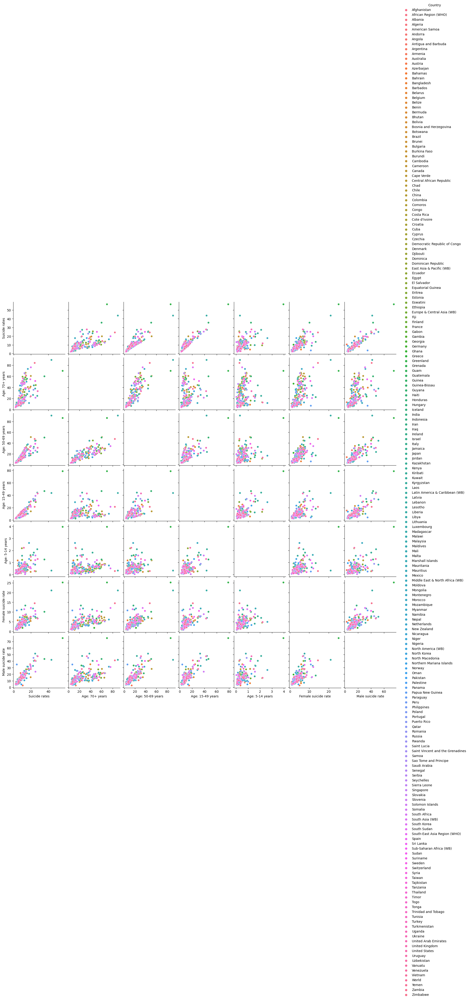

In [105]:
sns.pairplot(data, hue='Country')

It is hard to decipher some meaning from the above plotted charts. What I can see from a first glance is that the majority (>50%) of ountries seem to experience the same number of deaths within a range. There are other countries which experience higher levels of fatalities. This information could be useful when trying to assess then what is the difference between those countries which experience higher levels of fatalities from those countries who experience less. This may be beyond the scope of this project but is definitely something worth noting and bearing in mind for future work. 

Thinking about the above and from looking at the OurWorldinData site a better way of representing the data might be through bar charts or histograms. I've gone with bar charts based on this article. 
https://www.storytellingwithdata.com/blog/2021/1/28/histograms-and-bar-charts#:~:text=Histograms%20visualize%20quantitative%20data%20or,an%20axis%20would%20be%20foolish.

In [106]:
import matplotlib.pyplot as plt
%matplotlib inline
# https://stackoverflow.com/questions/35916976/plot-wont-show-in-jupyter

<AxesSubplot:title={'center':'Country vs. Suicide rate per 100,000'}, xlabel='Country', ylabel='Suicide rates'>

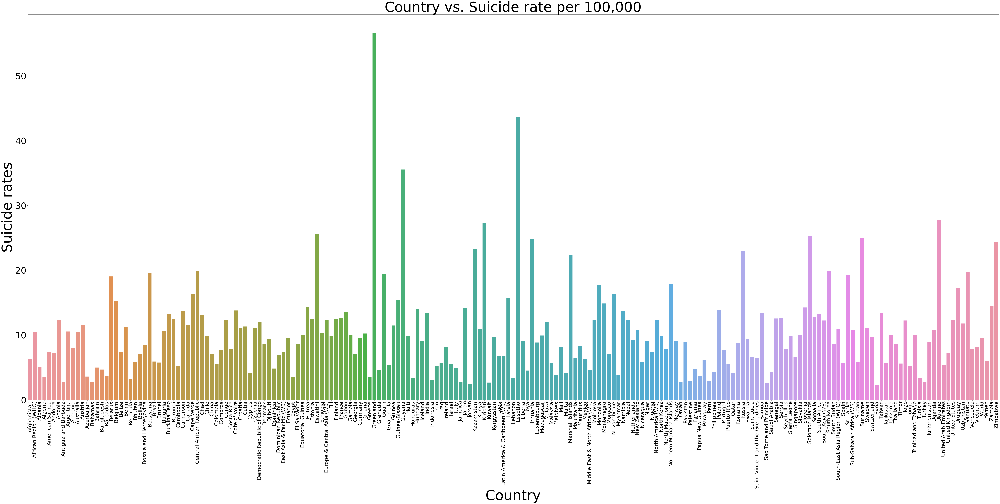

In [107]:
plt.figure(figsize=(100,40))
# https://drawingfromdata.com/pandas/seaborn/matplotlib/visualization/setting-figure-size-matplotlib-seaborn.html
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Suicide rate', fontsize=80)
plt.title('Country vs. Suicide rate per 100,000', fontsize=80)
# https://www.geeksforgeeks.org/rotate-axis-tick-labels-in-seaborn-and-matplotlib/
# https://stackoverflow.com/questions/6390393/matplotlib-make-tick-labels-font-size-smaller

sns.barplot(data=data, x="Country", y="Suicide rates")
# https://www.geeksforgeeks.org/seaborn-sort-bars-in-barplot/

The above plot was in alphabetic order. Looking at that we could see some countries had much higher suicide rates than others but much else could be deciphered from that represenation. A better way of representing this information might be if the trend was observed in descending order. This could help with future analysis as proposed above. 

<AxesSubplot:title={'center':'Country vs. Suicide rate per 100,000'}, xlabel='Country', ylabel='Suicide rates'>

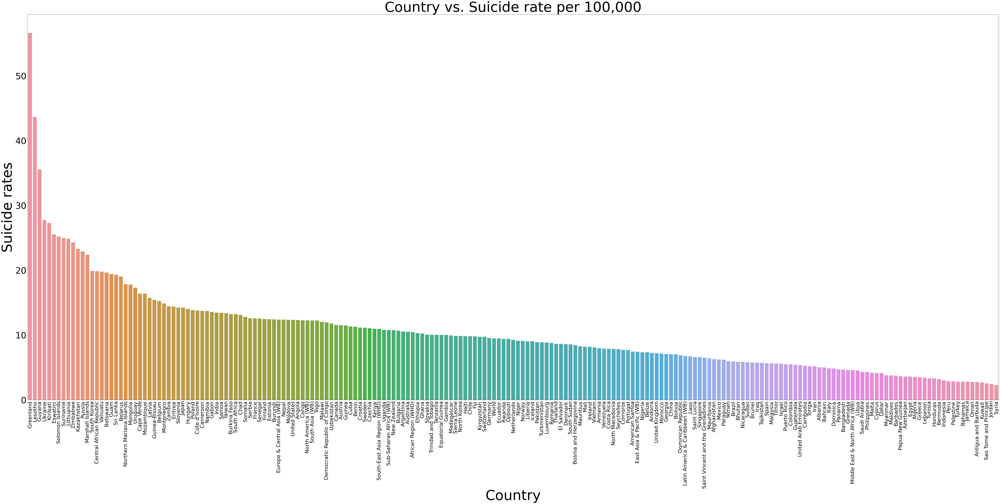

In [108]:
plt.figure(figsize=(100,40))
# https://drawingfromdata.com/pandas/seaborn/matplotlib/visualization/setting-figure-size-matplotlib-seaborn.html
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Suicide rate', fontsize=80)
plt.title('Country vs. Suicide rate per 100,000', fontsize=80)
# https://www.geeksforgeeks.org/rotate-axis-tick-labels-in-seaborn-and-matplotlib/
# https://stackoverflow.com/questions/6390393/matplotlib-make-tick-labels-font-size-smaller

sns.barplot(data=data, x="Country", y="Suicide rates", order=data.sort_values('Suicide rates',ascending = False).Country)
# https://www.geeksforgeeks.org/seaborn-sort-bars-in-barplot/

Looking at the chart when represented in descending order I can see that this information may fall in line with a Pareto distribution. There must be some common or contributing factors as to why some countries experience more deaths by suicide than others. As already mentioned this may be beyond the scope of this project but some information may become apparent once the graphs are categorised. 

Looking at the countries in red with over 20 deaths by suicide per 100,000 population (Greenland, Lesotho, Guyana, Ukraine, Kiribati, Eswatini, Solomon Islands, Suriname, Lithuania, Zimbabwe, Micronesia, Kazakhstan, Nauru, Russia, Marshall Islands) there are no immediate apparent trends for suicide rates. A much more in depth analysis into the economic and political situations of the countries would be required. 

**Describe Pareto Distribution in further detail.**

All trends below following the same principles as above are plotted.

<AxesSubplot:title={'center':'Country vs. Male suicide rate per 100,000'}, xlabel='Country', ylabel='Male suicide rate'>

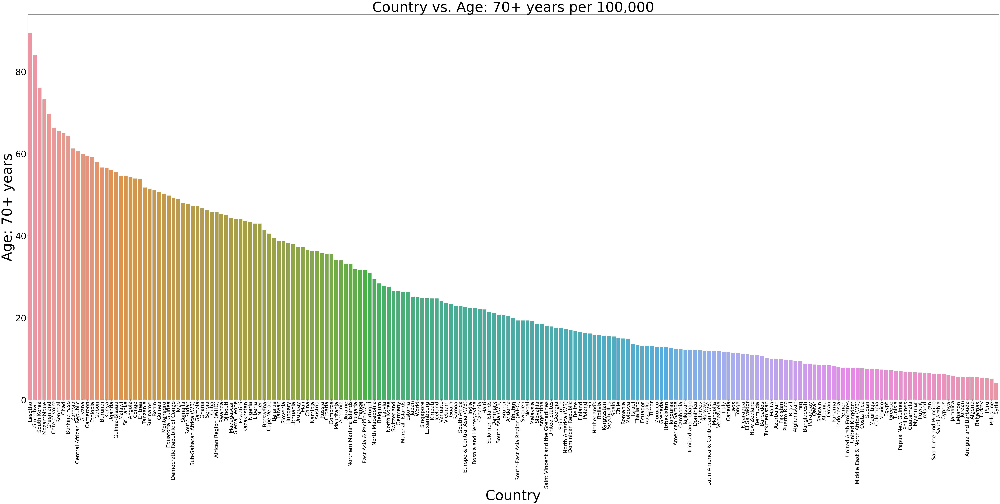

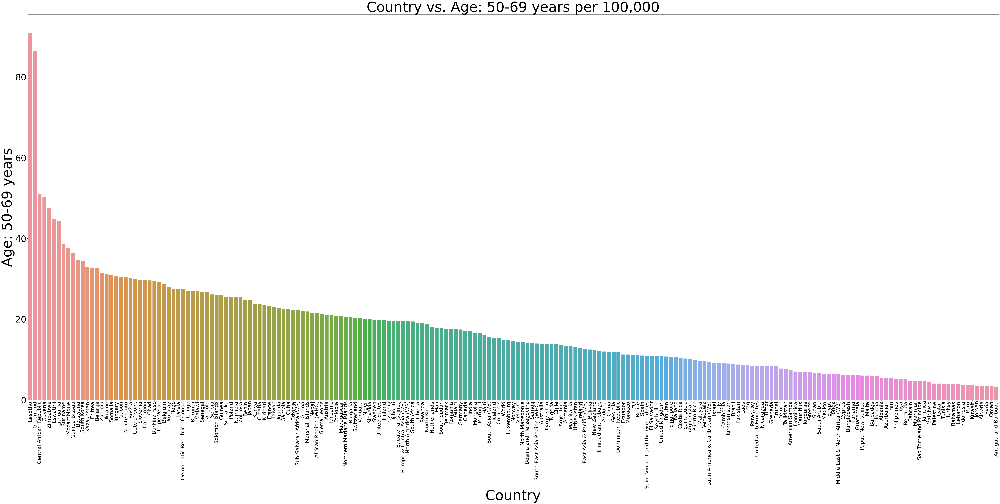

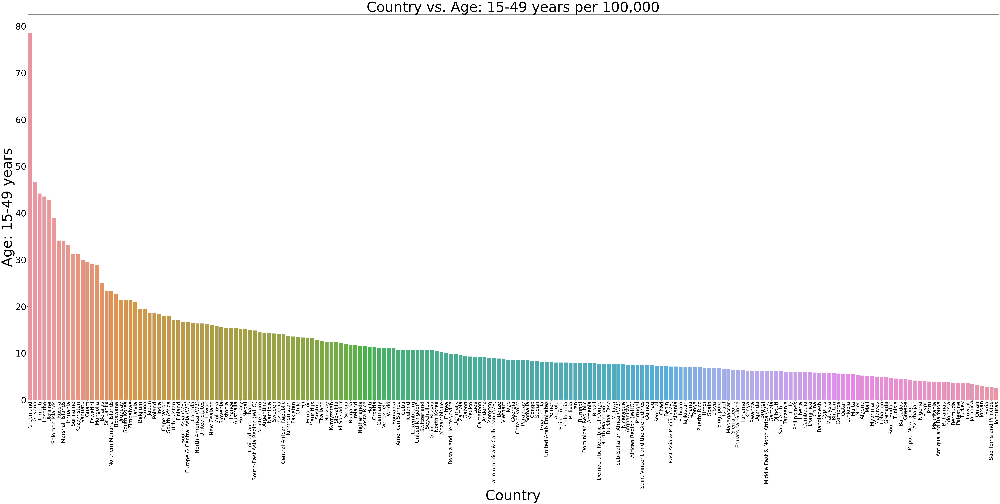

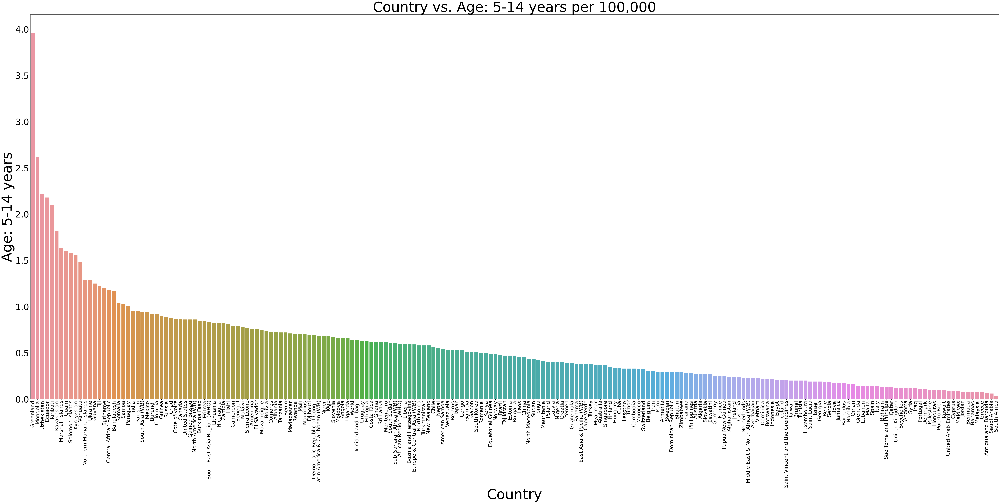

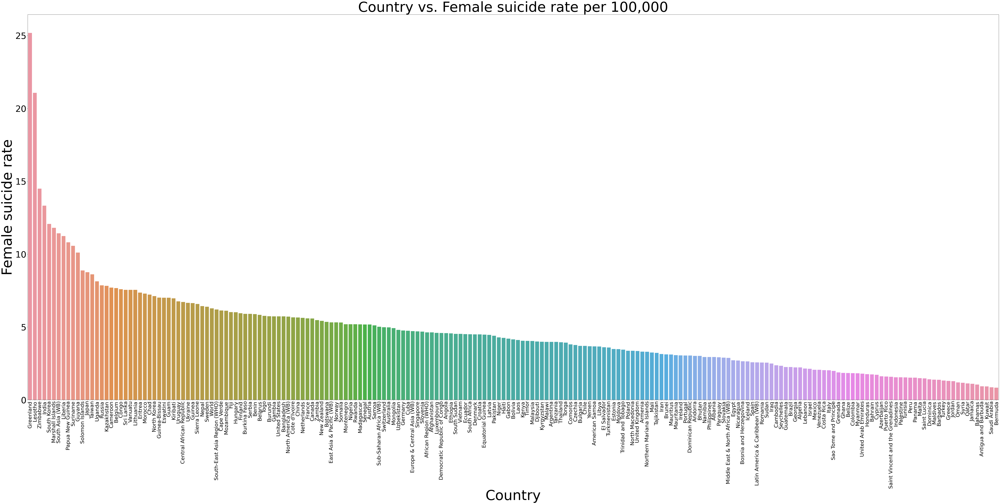

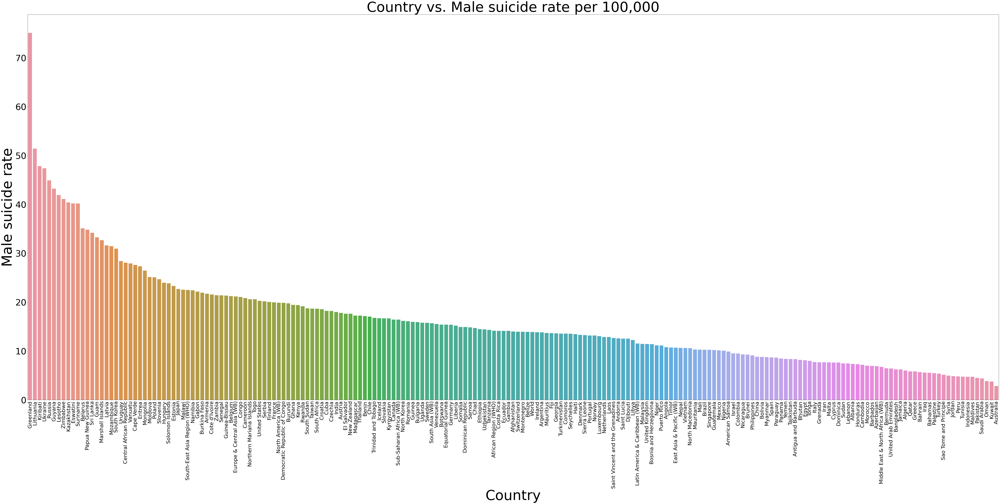

In [109]:
plt.figure(figsize=(100,40))
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Age: 70+ years', fontsize=80)
plt.title('Country vs. Age: 70+ years per 100,000', fontsize=80)
sns.barplot(data=data, x="Country", y="Age: 70+ years", order=data.sort_values('Age: 70+ years',ascending = False).Country)

plt.figure(figsize=(100,40))
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Age: 50-69 years', fontsize=80)
plt.title('Country vs. Age: 50-69 years per 100,000', fontsize=80)
sns.barplot(data=data, x="Country", y="Age: 50-69 years", order=data.sort_values('Age: 50-69 years',ascending = False).Country)

plt.figure(figsize=(100,40))
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Age: 15-49 years', fontsize=80)
plt.title('Country vs. Age: 15-49 years per 100,000', fontsize=80)
sns.barplot(data=data, x="Country", y="Age: 15-49 years", order=data.sort_values('Age: 15-49 years',ascending = False).Country)

plt.figure(figsize=(100,40))
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Age: 5-14 years', fontsize=80)
plt.title('Country vs. Age: 5-14 years per 100,000', fontsize=80)
sns.barplot(data=data, x="Country", y="Age: 5-14 years", order=data.sort_values('Age: 5-14 years',ascending = False).Country)

plt.figure(figsize=(100,40))
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Female suicide rate', fontsize=80)
plt.title('Country vs. Female suicide rate per 100,000', fontsize=80)
sns.barplot(data=data, x="Country", y="Female suicide rate", order=data.sort_values('Female suicide rate',ascending = False).Country)

plt.figure(figsize=(100,40))
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=50)
plt.xlabel('Country', fontsize=80)
plt.ylabel('Male suicide rate', fontsize=80)
plt.title('Country vs. Male suicide rate per 100,000', fontsize=80)
sns.barplot(data=data, x="Country", y="Male suicide rate", order=data.sort_values('Male suicide rate',ascending = False).Country)

**What may be interesting to do is pie charts and seperate the countried into continents. I may return to this if I have time after I complete the project superficially.**

In [110]:
data.describe()

,Suicide rates,Age: 70+ years,Age: 50-69 years,Age: 15-49 years,Age: 5-14 years,Female suicide rate,Male suicide rate
count,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000
mean,10.345517,26.308227,17.355764,11.825320,0.561084,4.619606,16.227340
std,6.934675,19.027775,12.344954,9.471106,0.492087,3.109734,10.278176
min,2.260000,4.180000,3.300000,2.530000,0.030000,0.840000,2.830000
25%,5.755000,10.950000,8.470000,6.230000,0.230000,2.575000,8.960000
50%,9.260000,20.020000,14.570000,8.530000,0.470000,4.150000,13.990000
75%,12.420000,40.055000,23.100000,14.225000,0.730000,5.735000,19.995000
max,56.610000,89.460000,90.920000,78.550000,3.960000,25.180000,75.080000


The most telling information from the dataset is that much more males than females are dying by suicide. Also a standout figure is the number of deaths occuring in the 70+ age group. 

### 3. Synthesize/ simulate data based on the data set - use a random generator

#### (i) Predict figures for different year dataset where limited information is available

Countries which did not have the full desired information were removed from this analysis for simplicity.